# General preprocessing data

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.preprocessing import StandardScaler

train = pd.read_csv('train.csv')
X_train = train.drop('smoking', axis=1)
Y_train= train['smoking']

X_test = pd.read_csv('test.csv')

x_train,x_test,y_train,y_test=train_test_split(X_train,Y_train,test_size=0.3,random_state=4)

scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

X_train_scaled= scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

In [15]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159256 entries, 0 to 159255
Data columns (total 24 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   159256 non-null  int64  
 1   age                  159256 non-null  int64  
 2   height(cm)           159256 non-null  int64  
 3   weight(kg)           159256 non-null  int64  
 4   waist(cm)            159256 non-null  float64
 5   eyesight(left)       159256 non-null  float64
 6   eyesight(right)      159256 non-null  float64
 7   hearing(left)        159256 non-null  int64  
 8   hearing(right)       159256 non-null  int64  
 9   systolic             159256 non-null  int64  
 10  relaxation           159256 non-null  int64  
 11  fasting blood sugar  159256 non-null  int64  
 12  Cholesterol          159256 non-null  int64  
 13  triglyceride         159256 non-null  int64  
 14  HDL                  159256 non-null  int64  
 15  LDL              

# PCA + random forest --> Not good performances

In [9]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardisation des données
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Réduction de dimension avec l'ACP
pca = PCA(n_components=5)  # Choisissez le nombre de composantes principales souhaité
X_train_pca = pca.fit_transform(X_train_scaled)


In [10]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Diviser les données en ensembles d'entraînement et de test
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_train_pca, Y_train, test_size=0.3, random_state=4)
print('etape1')

# Créer un modèle de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=4)

# Entraîner le modèle sur les données d'entraînement
rf_model.fit(X_train_pca, y_train)

# Prédire la probabilité
probability = rf_model.predict_proba(X_test_pca)[:, 1]


etape1


# Gaussian Mixture + rfc(0.868)/xgb(0.85)

In [13]:
import pandas as pd
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

In [11]:
from sklearn.preprocessing import StandardScaler

# Charger les données d'entraînement
train = pd.read_csv('train.csv')

# Exclure la colonne cible (dans cet exemple, 'smoking')
X_train = train.drop('smoking', axis=1)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

[2447082.6512635653]
[2447082.6512635653, 1590242.4857655065]
[2447082.6512635653, 1590242.4857655065, -346572.16993858444]
[2447082.6512635653, 1590242.4857655065, -346572.16993858444, -147792.8549598006]
[2447082.6512635653, 1590242.4857655065, -346572.16993858444, -147792.8549598006, -610775.5047968129]
[2447082.6512635653, 1590242.4857655065, -346572.16993858444, -147792.8549598006, -610775.5047968129, -723636.3853177697]
[2447082.6512635653, 1590242.4857655065, -346572.16993858444, -147792.8549598006, -610775.5047968129, -723636.3853177697, -762576.4430334773]
[2447082.6512635653, 1590242.4857655065, -346572.16993858444, -147792.8549598006, -610775.5047968129, -723636.3853177697, -762576.4430334773, -932929.875137339]
[2447082.6512635653, 1590242.4857655065, -346572.16993858444, -147792.8549598006, -610775.5047968129, -723636.3853177697, -762576.4430334773, -932929.875137339, -969645.0713556441]
[2447082.6512635653, 1590242.4857655065, -346572.16993858444, -147792.8549598006, -610

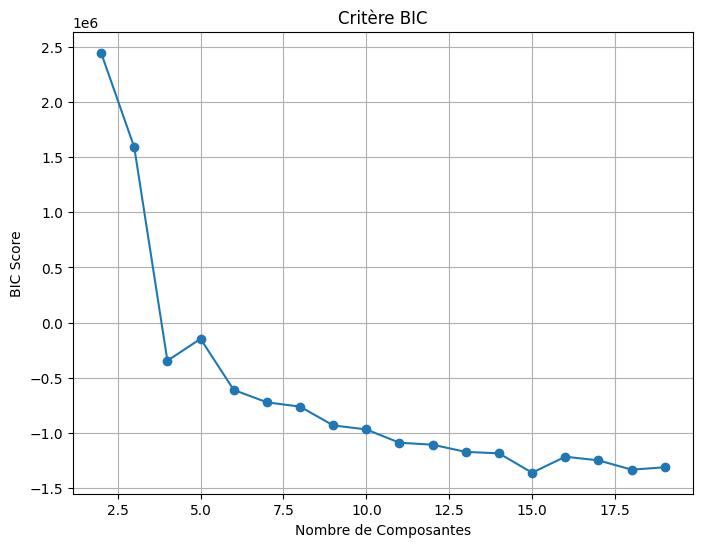

In [27]:
# Optimizing n_components with BIC

import pandas as pd
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

# Charger les données d'entraînement
train = pd.read_csv('train.csv')

# Exclure la colonne cible (dans cet exemple, 'smoking')
X_train = train.drop('smoking', axis=1)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Choisissez une plage de nombre de composantes à explorer
n_components_range = range(2, 20)  # Par exemple, de 2 à 10 composantes

# Initialisez des listes pour stocker les BIC et les modèles
bic_scores = []
gmm_models = []

# Boucle sur différentes valeurs de composantes
for n_components in n_components_range:
    # Créez et entraînez le modèle GMM pour cette valeur de composantes
    gmm = GaussianMixture(n_components=n_components, random_state=4)
    gmm.fit(X_train_scaled)
    
    # Enregistrez le modèle
    gmm_models.append(gmm)
    
    # Calculez le BIC pour ce modèle
    bic = gmm.bic(X_train_scaled)
    bic_scores.append(bic)
    print(bic_scores)

# Tracez les scores BIC en fonction du nombre de composantes
plt.figure(figsize=(8, 6))
plt.plot(n_components_range, bic_scores, marker='o', linestyle='-')
plt.xlabel('Nombre de Composantes')
plt.ylabel('BIC Score')
plt.title('Critère BIC')
plt.grid(True)
plt.show()


In [30]:
#Optimizing with AIC
import pandas as pd
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Charger les données d'entraînement
train = pd.read_csv('train.csv')

# Exclure la colonne cible (dans cet exemple, 'smoking')
X_train = train.drop('smoking', axis=1)

# Standardisation des données
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Choisissez une plage de nombre de composantes à explorer
n_components_range = range(2, 20)  # Par exemple, de 2 à 10 composantes

# Initialisez des listes pour stocker les AIC et les modèles
aic_scores = []
gmm_models = []

# Boucle sur différentes valeurs de composantes
for n_components in n_components_range:
    # Créez et entraînez le modèle GMM pour cette valeur de composantes
    gmm = GaussianMixture(n_components=n_components, random_state=4)
    gmm.fit(X_train_scaled)
    
    # Enregistrez le modèle
    gmm_models.append(gmm)
    
    # Calculez l'AIC pour ce modèle
    aic = gmm.aic(X_train_scaled)
    aic_scores.append(aic)
    print(aic_scores)

# Tracez les scores AIC en fonction du nombre de composantes
plt.figure(figsize=(8, 6))
plt.plot(n_components_range, aic_scores, marker='o', linestyle='-')
plt.xlabel('Nombre de Composantes')
plt.ylabel('AIC Score')
plt.title('Critère AIC')
plt.grid(True)
plt.show()

[2441105.6685822145]
[2441105.6685822145, 1581272.0226093554]
[2441105.6685822145, 1581272.0226093554, -358536.1135695356]
[2441105.6685822145, 1581272.0226093554, -358536.1135695356, -162750.27906555193]
[2441105.6685822145, 1581272.0226093554, -358536.1135695356, -162750.27906555193, -628726.4093773643]
[2441105.6685822145, 1581272.0226093554, -358536.1135695356, -162750.27906555193, -628726.4093773643, -744580.7703731213]
[2441105.6685822145, 1581272.0226093554, -358536.1135695356, -162750.27906555193, -628726.4093773643, -744580.7703731213, -786514.308563629]
[2441105.6685822145, 1581272.0226093554, -358536.1135695356, -162750.27906555193, -628726.4093773643, -744580.7703731213, -786514.308563629, -959861.2211422909]
[2441105.6685822145, 1581272.0226093554, -358536.1135695356, -162750.27906555193, -628726.4093773643, -744580.7703731213, -786514.308563629, -959861.2211422909, -999569.8978353961]
[2441105.6685822145, 1581272.0226093554, -358536.1135695356, -162750.27906555193, -62872

KeyboardInterrupt: 

In [31]:
import pandas as pd
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# Charger les données d'entraînement
train = pd.read_csv('train.csv')
X_train = train.drop(['smoking', 'id'], axis=1)
y_train = train['smoking']

# Charger les données de test
test = pd.read_csv('test.csv')
X_test = test.drop(['id'], axis=1)
print('dataset loaded')

optimal_n_components = 15  # 15 BIC, 14 AIC

# Créez et entraînez le modèle GMM avec le nombre optimal de composantes
gmm = GaussianMixture(n_components=optimal_n_components, random_state=4)
print('gaussian mixture created')

cluster_labels = gmm.fit_predict(X_train)
print('cluster labels defined')

# Ajoutez les labels de cluster comme nouvelles features
X_train['cluster_label'] = cluster_labels
X_test['cluster_label'] = gmm.predict(X_test)
print('clusters added to df')

# Standardisation des données
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print('df scaled')

# Entraînez un modèle XGBoost avec les nouvelles features

print('loading xgb model')
xgb_model = xgb.XGBClassifier(n_estimators=500, 
                              random_state=4, 
                              colsample_bytree=0.6, 
                              learning_rate=0.1, 
                              max_depth=5, 
                              subsample=0.9)

print('fitting xgb model')
xgb_model.fit(X_train_scaled, y_train, verbose=2)

# Prédisez les probabilités avec le modèle XGBoost
xgb_probabilities = xgb_model.predict_proba(X_test_scaled)[:, 1]
print('finished')

dataset loaded
gaussian mixture created
cluster labels defined
clusters added to df
df scaled
loading xgb model
fitting xgb model


In [32]:
#Submission

# Créez un DataFrame avec les identifiants (ids) et les probabilités
submission_df_xgb = pd.DataFrame({'id': range(159256, 159256 + len(xgb_probabilities)), 'smoking': xgb_probabilities.ravel()})

# Sauvegardez le DataFrame dans un fichier CSV
submission_df_xgb.to_csv('submission_xgb.csv', index=False)

In [26]:
X_test

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,cluster_label
0,40,165,70,84.0,1.2,1.2,1,1,130,89,...,49,115,14.2,1,0.9,19,25,32,0,9
1,80,160,60,93.0,1.0,1.0,2,2,144,72,...,35,104,13.0,1,1.1,20,12,24,0,4
2,60,170,70,86.5,0.6,0.7,1,1,117,75,...,39,88,15.4,1,1.4,38,60,36,0,9
3,40,160,50,67.0,0.3,0.4,1,1,116,62,...,75,128,14.5,1,0.6,25,18,10,1,8
4,40,170,75,89.4,1.0,0.9,1,1,132,94,...,39,123,16.5,1,1.0,30,39,27,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106166,40,165,60,78.0,0.8,0.9,1,1,112,78,...,59,149,16.4,1,1.1,24,31,28,0,9
106167,40,170,85,95.0,1.2,1.2,1,1,130,90,...,44,100,16.0,2,1.0,25,31,38,0,3
106168,35,170,85,89.0,1.2,1.2,1,1,131,86,...,53,142,15.9,1,0.8,33,32,24,1,8
106169,40,160,60,67.0,0.7,0.8,1,1,120,80,...,55,103,13.9,1,0.6,42,36,32,0,9


# Tuning XGB-GMM

In [17]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

auc_scores = []


# Créer un modèle XGBoost
xgb_model = xgb.XGBClassifier()
print('model initialized')

# Définir la grille des hyperparamètres à explorer
param_grid = {
    'n_estimators': [300, 350, 400, 500],
    'learning_rate': [0.1, 0.15, 0.05],
    'max_depth': [5, 7, 10],
    'subsample': [0.9, 0.95,],
    'colsample_bytree': [0.8, 0.7, 0.6]
}

# Utiliser GridSearchCV pour trouver les meilleurs hyperparamètres
print('Début de la recherche GridSearchCV')
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, scoring='roc_auc', cv=5, verbose=2)
print('Fit de la recherche GridSearchCV')
grid_search.fit(x_train_scaled, y_train)
print('Fin de la recherche GridSearchCV')

# Afficher les scores AUC-ROC à chaque itération
results = grid_search.cv_results_
for mean_score, params in zip(results['mean_test_score'], results['params']):
    print(f'AUC-ROC: {mean_score:.4f} with parameters: {params}')

# Afficher les meilleurs hyperparamètres
best_params = grid_search.best_params_
print("Meilleurs hyperparamètres:", best_params)


model initialized
Début de la recherche GridSearchCV
Fit de la recherche GridSearchCV
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=300, subsample=0.9; total time=   4.4s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=300, subsample=0.9; total time=   2.1s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=300, subsample=0.9; total time=   1.3s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=300, subsample=0.9; total time=   1.2s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=300, subsample=0.9; total time=   1.2s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=300, subsample=0.95; total time=   1.2s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=5, n_estimators=300, subsample=0.95; total time=   1.2s
[CV] END colsample_bytree=0.8, learning_rat

In [18]:
# Entraîner le modèle XGBoost avec les meilleurs hyperparamètres
print('training xgboost')
best_xgb_model = xgb.XGBClassifier(**best_params)
print('fitting xgboost')
best_xgb_model.fit(x_train_scaled, y_train)

print('predicting probas')
# Prédire les probabilités avec le modèle optimisé
xgb_probabilities = best_xgb_model.predict_proba(X_test_scaled)[:, 1]

training xgboost
fitting xgboost
predicting probas


In [19]:
# Créez un DataFrame avec les identifiants (ids) et les probabilités
submission_df_xgb = pd.DataFrame({'id': range(159256, 159256 + len(xgb_probabilities)), 'smoking': xgb_probabilities.ravel()})

# Sauvegardez le DataFrame dans un fichier CSV
submission_df_xgb.to_csv('submission_xgb_2.csv', index=False)

(47777,)

# Logreg

In [24]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler

logisticRegr = LogisticRegression(C=100, penalty='l2', max_iter=100)
logisticRegr.fit(x_train_scaled, y_train)

predictions = logisticRegr.predict(x_test_scaled)

# Assuming 'y_test' contains the true labels and 'predictions' contains the predicted labels
auc = roc_auc_score(y_test, predictions)

print(f"AUC-ROC Score: {auc}")

AUC-ROC Score: 0.7476514418880985


In [25]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Hyperparamètre de régularisation
    'penalty': ['l2'],  # Type de régularisation (L1 ou L2)
    'max_iter': [100, 200, 300]  # Nombre maximum d'itérations
}

# Créez une instance de modèle de régression logistique
logistic_regression = LogisticRegression()

# Créez un objet GridSearchCV
grid_search = GridSearchCV(logistic_regression, param_grid, cv=5, scoring='roc_auc', verbose=True)

# Ajustez le modèle aux données d'entraînement en effectuant la recherche par grille
grid_search.fit(x_train_scaled, y_train)

# Obtenez les meilleurs hyperparamètres et le meilleur modèle
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print(f"Meilleurs hyperparamètres : {best_params}")

# Prédisez les probabilités des classes positives sur les données de test
y_prob = best_model.predict_proba(x_test_scaled)[:, 1]

# Calculez l'AUC-ROC
roc_auc = roc_auc_score(y_test, y_prob)

print(f"AUC-ROC : {roc_auc}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Meilleurs hyperparamètres : {'C': 100, 'max_iter': 100, 'penalty': 'l2'}
AUC-ROC : 0.8352477588440878


In [31]:
#Real Predictions

logisticRegr = LogisticRegression(C=100, penalty='l2', max_iter=100)
logisticRegr.fit(X_train_scaled, Y_train)

# Prédisez les probabilités des classes positives sur les données de test
y_prob = logisticRegr.predict_proba(X_test_scaled)[:, 1]
y_prob

array([0.39469318, 0.19172114, 0.62883513, ..., 0.40990622, 0.13567616,
       0.08017459])

In [32]:
#Submission
# Créez un DataFrame avec les identifiants (ids) et les probabilités
submission_df = pd.DataFrame({'id': range(159256, 159256 + len(y_prob)), 'smoking': y_prob})

# Sauvegardez le DataFrame dans un fichier CSV
submission_df.to_csv('submission.csv', index=False)

# DNN -85%

In [39]:
#Tuning for best ROC AUC
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import roc_auc_score

# Créez un modèle de réseau de neurones
model = keras.Sequential([
    keras.layers.Input(shape=(x_train_scaled.shape[1],)),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')  # Pour la classification binaire
])

# Compilez le modèle avec l'optimiseur Adam et la perte binaire
model.compile(optimizer='adam', loss='binary_crossentropy')

# Définissez des variables pour enregistrer la meilleure AUC-ROC et l'époque correspondante
best_auc_roc = 0
best_epoch = 0

# Entraînez le modèle sur plusieurs époques
for epoch in range(1, 11):  # Vous pouvez ajuster le nombre d'époques ici
    model.fit(x_train_scaled, y_train, epochs=1, batch_size=32, verbose=1)
    
    # Prédisez les probabilités des classes positives sur les données de validation
    y_prob = model.predict(x_test_scaled)
    
    # Calculez l'AUC-ROC sur l'ensemble de validation
    auc_roc = roc_auc_score(y_test, y_prob)
    
    print(f"Epoch {epoch}/{10} - AUC-ROC: {auc_roc}")
    
    # Vérifiez si l'AUC-ROC actuelle est meilleure que la meilleure précédente
    if auc_roc > best_auc_roc:
        best_auc_roc = auc_roc
        best_epoch = epoch

print(f"Meilleure AUC-ROC : {best_auc_roc} à l'époque {best_epoch}")


1494/1494 [==============================] - 4s 2ms/step
Epoch 1/10 - AUC-ROC: 0.8533262204472862
1494/1494 [==============================] - 5s 3ms/step
Epoch 2/10 - AUC-ROC: 0.8561526426346907
1494/1494 [==============================] - 4s 3ms/step
Epoch 3/10 - AUC-ROC: 0.8540469018585571
1494/1494 [==============================] - 4s 2ms/step
Epoch 4/10 - AUC-ROC: 0.8568617642389704
1494/1494 [==============================] - 2s 2ms/step
Epoch 5/10 - AUC-ROC: 0.8561232106347619
1494/1494 [==============================] - 3s 2ms/step
Epoch 6/10 - AUC-ROC: 0.8564834525842536
1494/1494 [==============================] - 3s 2ms/step
Epoch 7/10 - AUC-ROC: 0.8572096260826912
1494/1494 [==============================] - 3s 2ms/step
Epoch 8/10 - AUC-ROC: 0.85756488307116
1494/1494 [==============================] - 4s 3ms/step
Epoch 9/10 - AUC-ROC: 0.8564204612893426
1494/1494 [==============================] - 3s 2ms/step
Epoch 10/10 - AUC-ROC: 0.8556720792245914
Meilleure AUC-ROC : 0

In [47]:
#Real predictions 
# Créez un modèle de réseau de neurones
model = keras.Sequential([
    keras.layers.Input(shape=(X_train_scaled.shape[1],)),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')  # Pour la classification binaire
])

# Compilez le modèle avec l'optimiseur Adam et la perte binaire
model.compile(optimizer='adam', loss='binary_crossentropy')


model.fit(X_train_scaled, Y_train, epochs=8, batch_size=32, verbose=1)
    
# Prédisez les probabilités des classes positives sur les données de validation
y_prob = model.predict(X_test_scaled)

Epoch 1/8
4977/4977 [==============================] - 22s 4ms/step - loss: 0.4643
Epoch 2/8
4977/4977 [==============================] - 20s 4ms/step - loss: 0.4552
Epoch 3/8
4977/4977 [==============================] - 21s 4ms/step - loss: 0.4524
Epoch 4/8
4977/4977 [==============================] - 21s 4ms/step - loss: 0.4511
Epoch 5/8
4977/4977 [==============================] - 19s 4ms/step - loss: 0.4496
Epoch 6/8
4977/4977 [==============================] - 23s 5ms/step - loss: 0.4482
Epoch 7/8
4977/4977 [==============================] - 23s 5ms/step - loss: 0.4467
Epoch 8/8
3318/3318 [==============================] - 6s 2ms/step


In [48]:
#Submission

# Créez un DataFrame avec les identifiants (ids) et les probabilités
submission_df = pd.DataFrame({'id': range(159256, 159256 + len(y_prob)), 'smoking': y_prob.ravel()})

# Sauvegardez le DataFrame dans un fichier CSV
submission_df.to_csv('submission.csv', index=False)

# Exploration

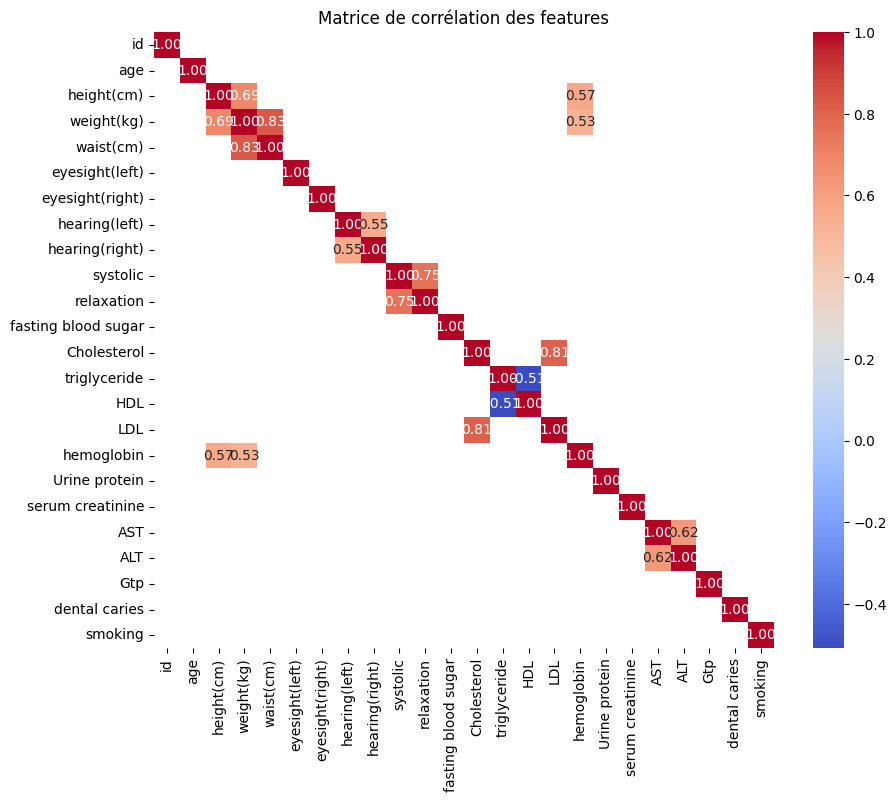

In [21]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.preprocessing import StandardScaler

# Charger les données d'entraînement
train = pd.read_csv('train.csv')

# Exclure la colonne cible (dans cet exemple, 'smoking')
X_train = train.drop('smoking', axis=1)
Y_train = train['smoking']

# Charger les données de test
X_test = pd.read_csv('test.csv')

# Diviser les données en ensembles d'entraînement et de test
x_train, x_test, y_train, y_test = train_test_split(X_train, Y_train, test_size=0.3, random_state=4)

# Standardisation des données
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Calculer la matrice de corrélation
correlation_matrix = train.corr()

# Sélectionner uniquement les features corrélées à plus de 0.1
highly_correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if ((correlation_matrix.iloc[i, j]<1) and (correlation_matrix.iloc[i, j] > 0.5) | (correlation_matrix.iloc[i, j] < -0.5) ):
            colname = correlation_matrix.columns[i]
            highly_correlated_features.add(colname)


threshold = 0.5
highly_correlated_features = (correlation_matrix
    .where((correlation_matrix<=1) & (correlation_matrix > threshold) | (correlation_matrix < -threshold))
    .dropna(how='all', axis=1)
    .dropna(how='all', axis=0))


# Tracer la matrice de corrélation avec Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_features, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matrice de corrélation des features')
plt.show()



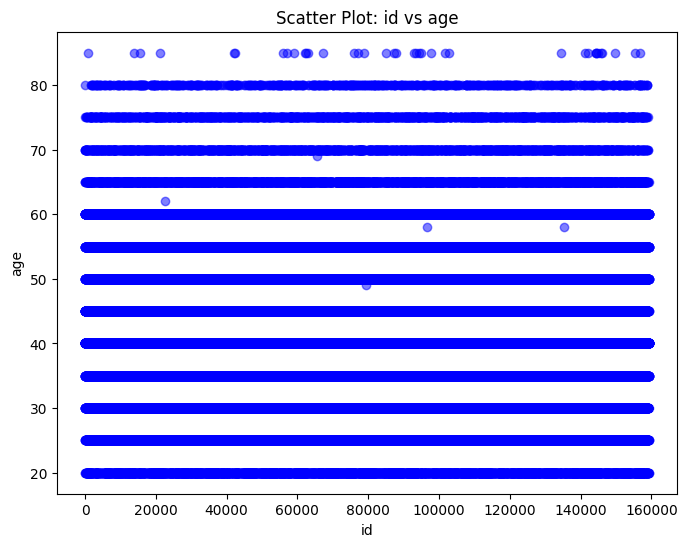

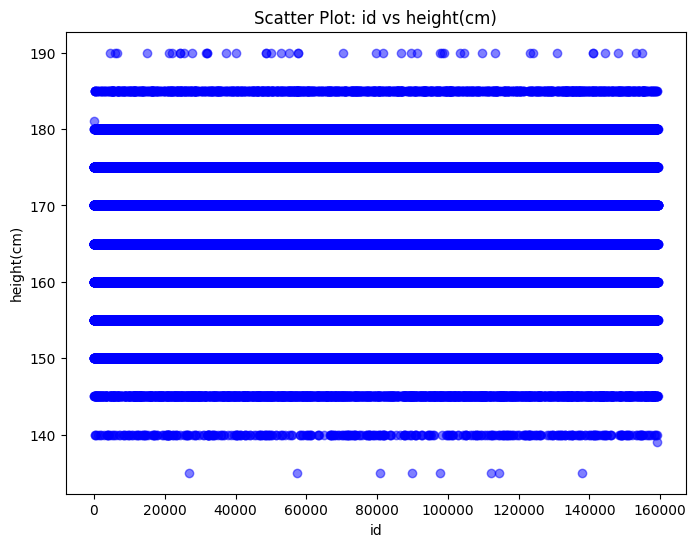

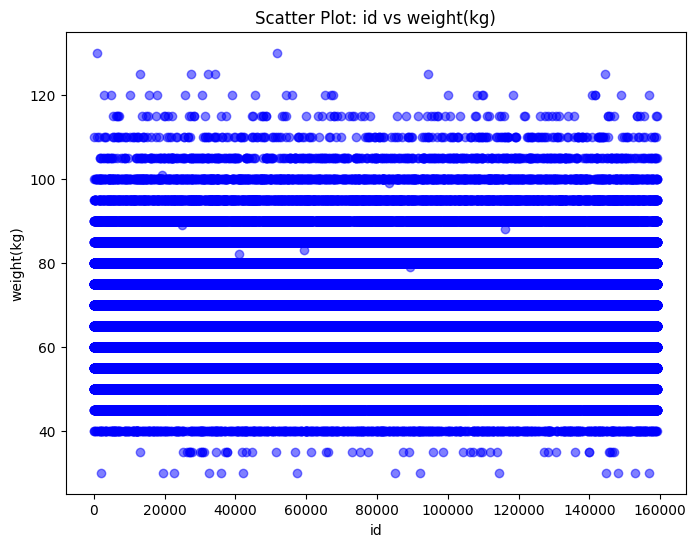

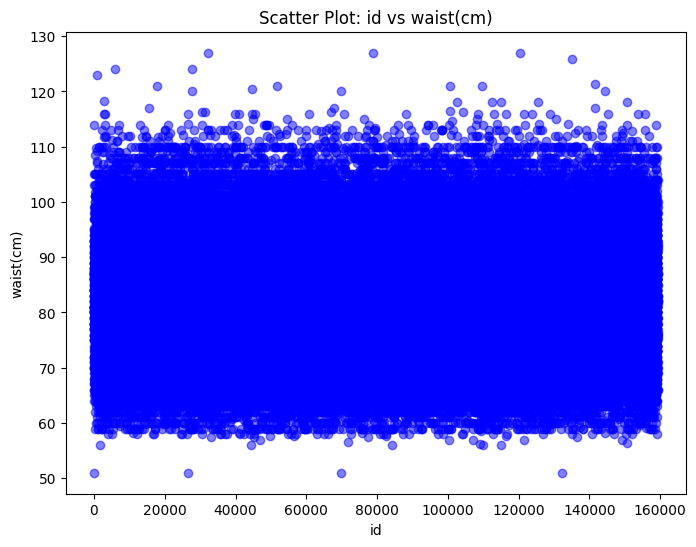

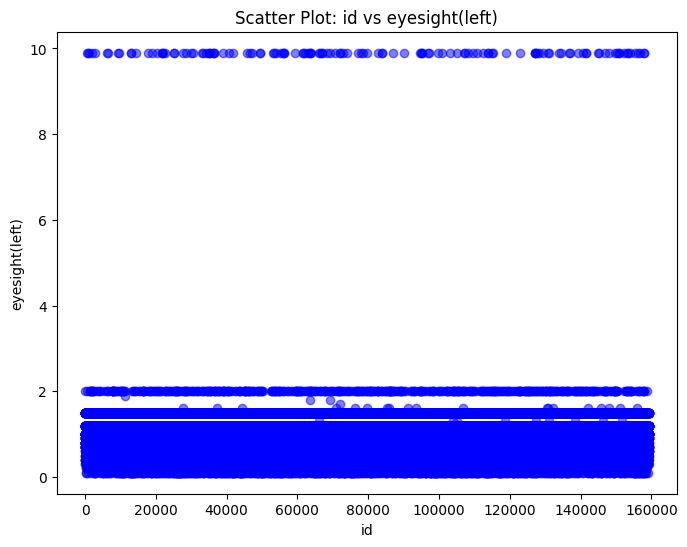

...

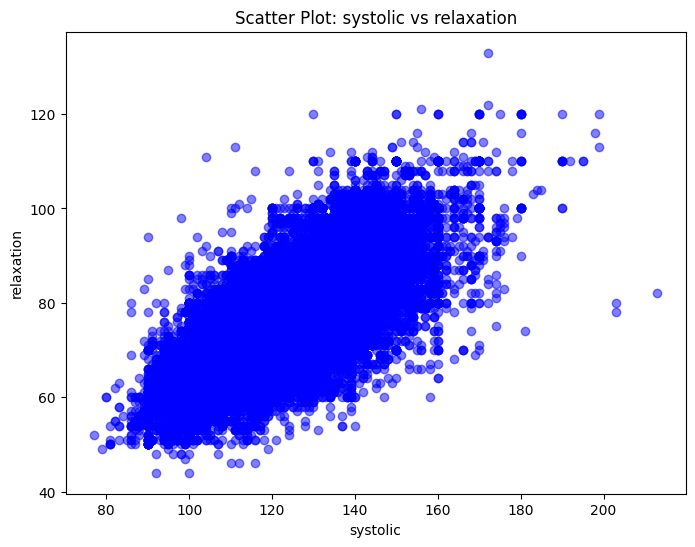

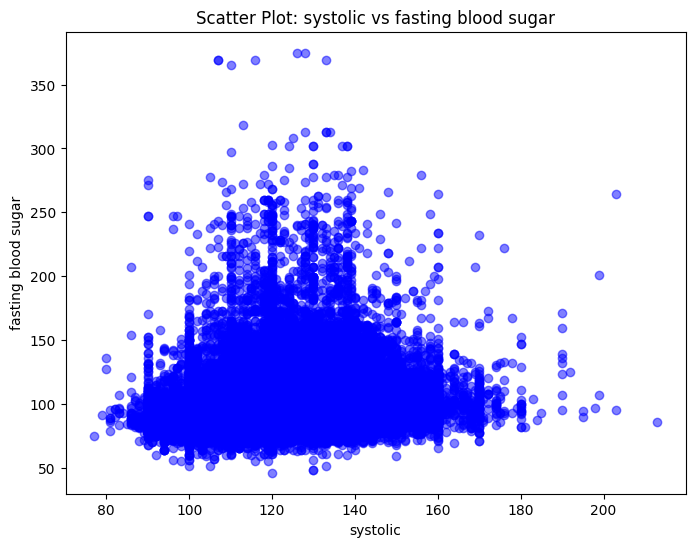

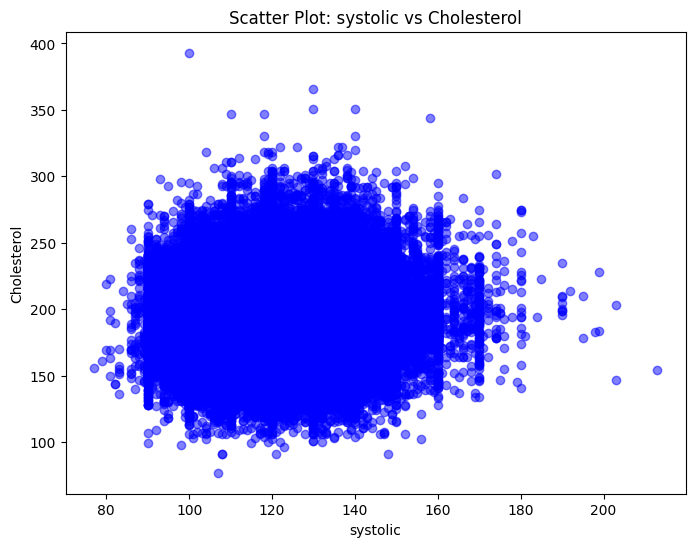

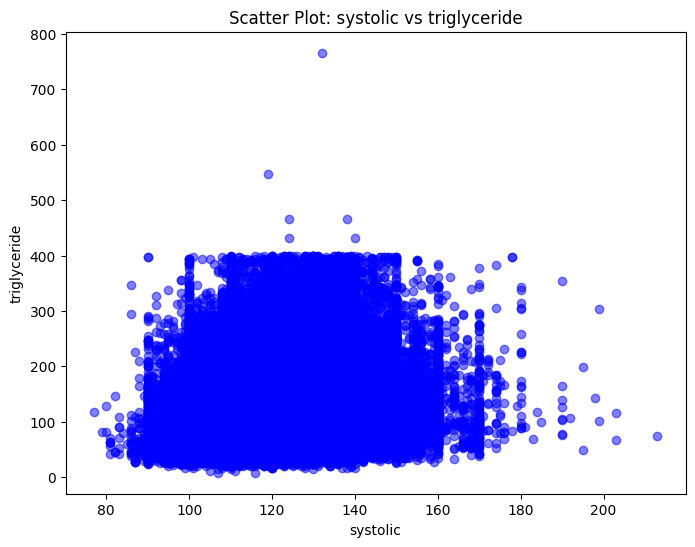

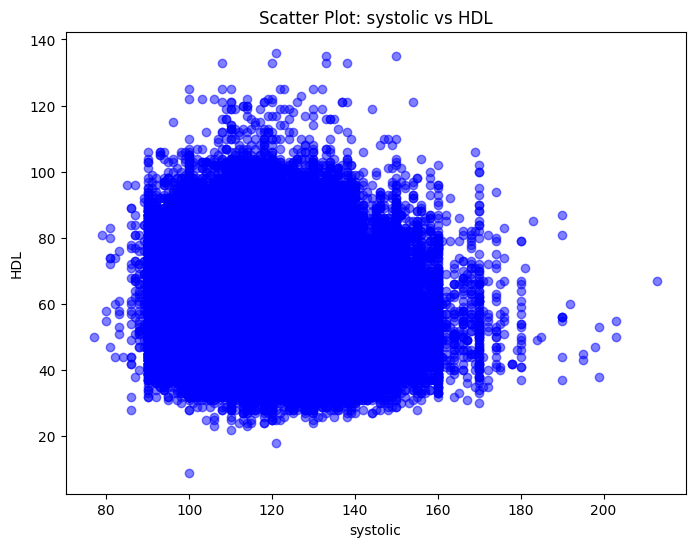

KeyboardInterrupt: 

In [30]:
# Créer un scatter plot des paires de features corrélées
for feature1 in highly_correlated_features.columns:
    for feature2 in highly_correlated_features.columns:
        if feature1 != feature2:  # Éviter de comparer une feature avec elle-même
            plt.figure(figsize=(8, 6))
            plt.scatter(train[feature1], train[feature2], c='b', alpha=0.5)
            plt.title(f'Scatter Plot: {feature1} vs {feature2}')
            plt.xlabel(feature1)
            plt.ylabel(feature2)
            plt.show()

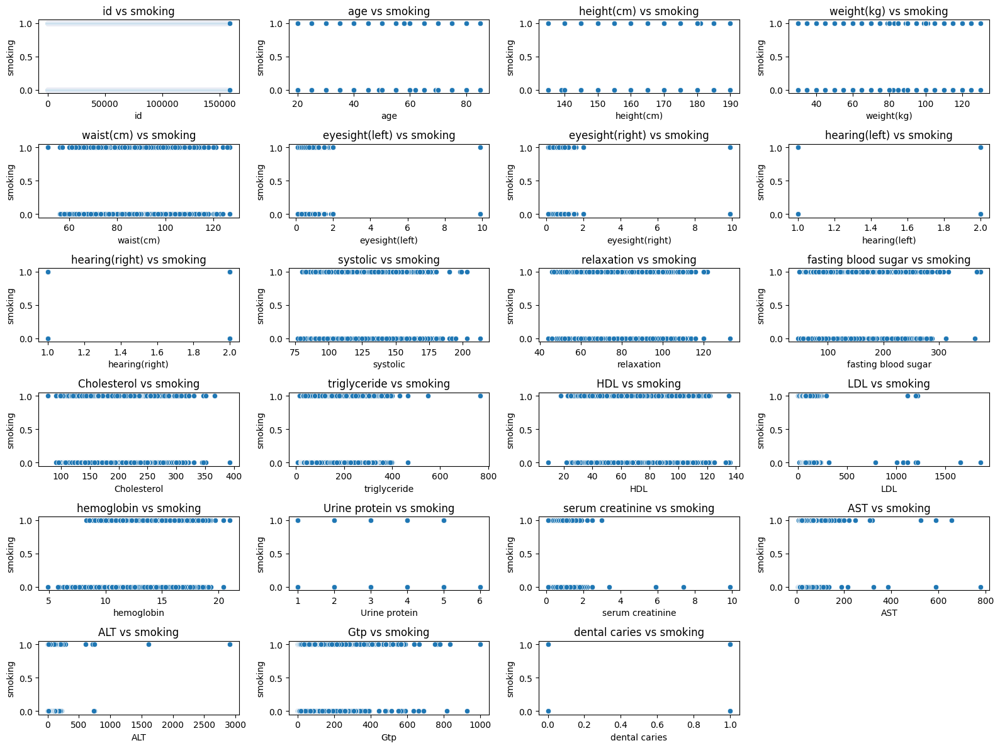

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math

# Charger les données d'entraînement
train = pd.read_csv('train.csv')

# Exclure la colonne cible (dans cet exemple, 'smoking')
X_train = train.drop('smoking', axis=1)
Y_train = train['smoking']

# Déterminer le nombre de colonnes par ligne dans le tracé
num_cols = 4

# Calculer le nombre total de lignes en fonction du nombre de colonnes
num_features = len(X_train.columns)
num_rows = math.ceil(num_features / num_cols)

# Créer une grille de sous-plots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 2 * num_rows))
fig.subplots_adjust(hspace=0.5)

# Tracer les scatter plots des distributions de features par rapport à 'smoking'
for i, feature in enumerate(X_train.columns):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    
    sns.scatterplot(data=train, x=feature, y='smoking', ax=ax)
    
    ax.set_title(f'{feature} vs smoking')
    ax.set_xlabel(feature)
    ax.set_ylabel('smoking')
    
# Supprimer les sous-plots inutilisés s'il y a moins de 4 features par ligne
for i in range(num_features, num_cols * num_rows):
    fig.delaxes(axes[i // num_cols, i % num_cols])

plt.tight_layout()
plt.show()


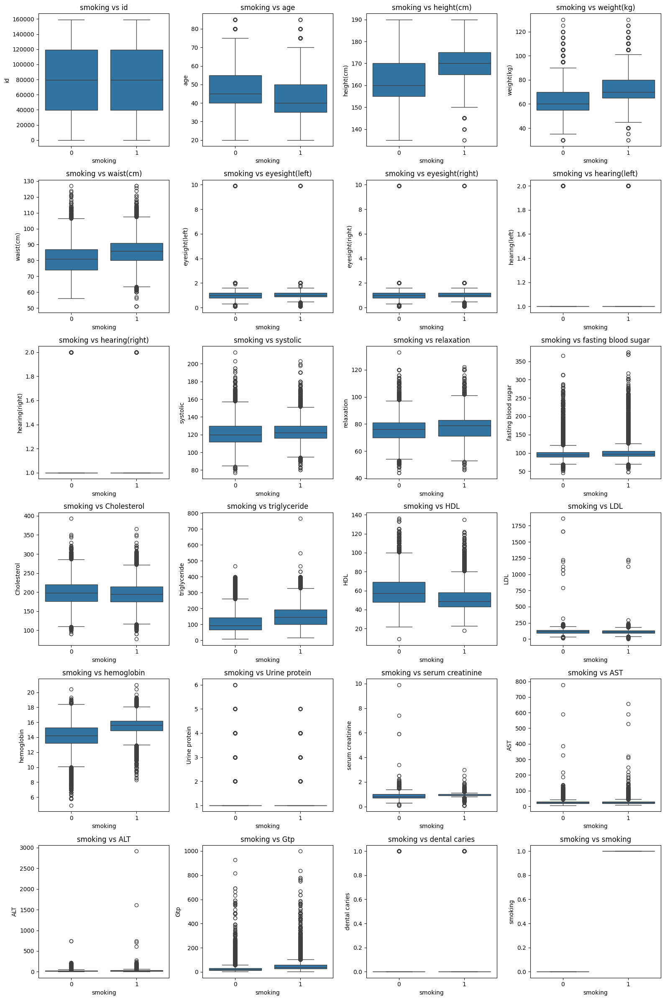

In [35]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Charger les données d'entraînement
train = pd.read_csv('train.csv')

# Features numériques
numeric_features = train.select_dtypes(include=['float64', 'int64']).columns

# Variable catégorielle
categorical_variable = 'smoking'

# Nombre de colonnes par ligne dans le tracé
num_cols = 4

# Calculer le nombre total de lignes en fonction du nombre de colonnes
num_features = len(numeric_features)
num_rows = (num_features // num_cols) + (num_features % num_cols)

# Créer une grille de sous-plots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 4 * num_rows))
fig.subplots_adjust(hspace=0.5)

# Itérer à travers les features numériques et créer les visualisations
for i, feature in enumerate(numeric_features):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    # Utiliser un box plot pour visualiser l'impact de 'smoking' sur la feature
    sns.boxplot(data=train, x=categorical_variable, y=feature, ax=ax)
    ax.set_title(f'{categorical_variable} vs {feature}')
    ax.set_xlabel(categorical_variable)
    ax.set_ylabel(feature)

# Supprimer les sous-plots inutilisés s'il y a moins de 4 features par ligne
for i in range(num_features, num_cols * num_rows):
    fig.delaxes(axes[i // num_cols, i % num_cols])

plt.tight_layout()
plt.show()


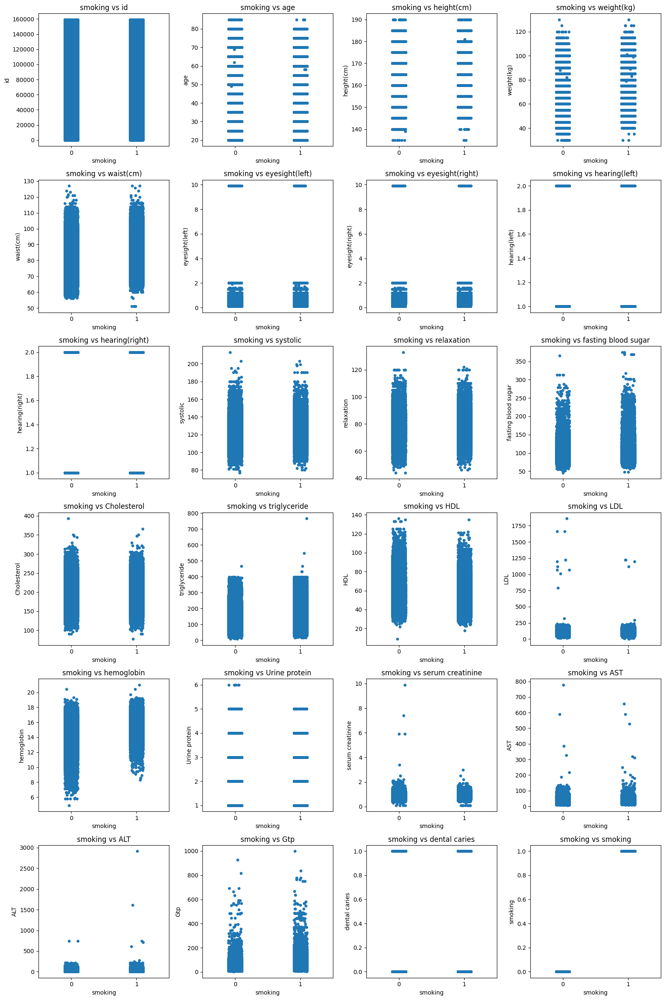

In [37]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Charger les données d'entraînement
train = pd.read_csv('train.csv')

# Features numériques
numeric_features = train.select_dtypes(include=['float64', 'int64']).columns

# Variable catégorielle
categorical_variable = 'smoking'

# Nombre de colonnes par ligne dans le tracé
num_cols = 4

# Calculer le nombre total de lignes en fonction du nombre de colonnes
num_features = len(numeric_features)
num_rows = (num_features // num_cols) + (num_features % num_cols)

# Créer une grille de sous-plots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 4 * num_rows))
fig.subplots_adjust(hspace=0.5)

# Itérer à travers les features numériques et créer les visualisations
for i, feature in enumerate(numeric_features):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    # Utiliser un stripplot pour visualiser l'impact de 'smoking' sur la feature
    sns.stripplot(data=train, x=categorical_variable, y=feature, ax=ax, jitter=True)
    ax.set_title(f'{categorical_variable} vs {feature}')
    ax.set_xlabel(categorical_variable)
    ax.set_ylabel(feature)

# Supprimer les sous-plots inutilisés s'il y a moins de 4 features par ligne
for i in range(num_features, num_cols * num_rows):
    fig.delaxes(axes[i // num_cols, i % num_cols])

plt.tight_layout()
plt.show()


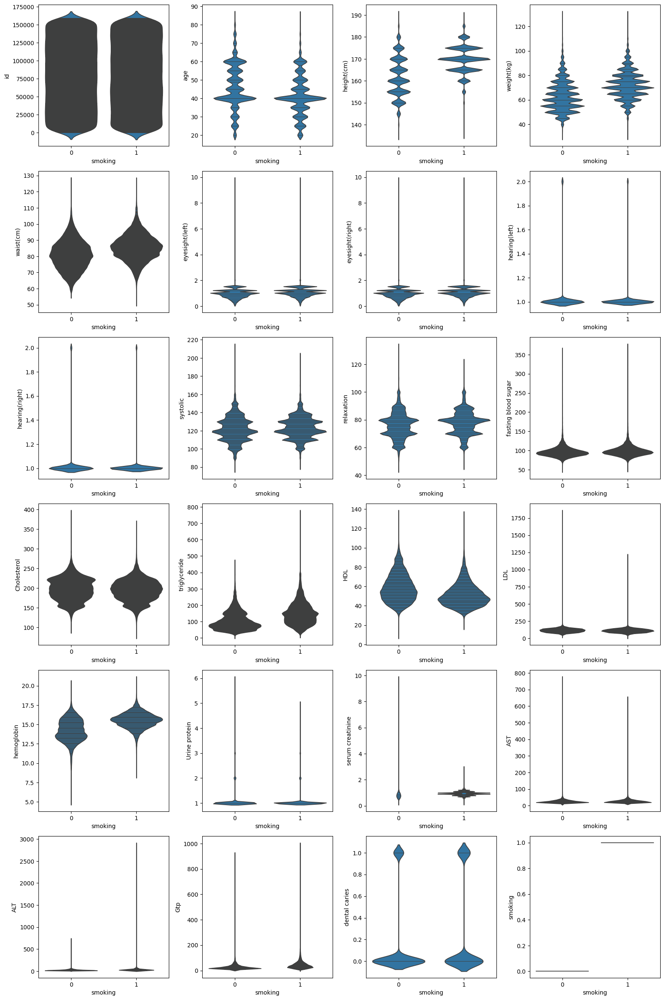

In [39]:
# Créer une grille de sous-plots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 4 * num_rows))
fig.subplots_adjust(hspace=0.5)

# Itérer à travers les features numériques et créer les visualisations
for i, feature in enumerate(numeric_features):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    
    # Utiliser un violin plot pour la distribution
    sns.violinplot(data=train, x=categorical_variable, y=feature, ax=ax, inner='stick')
    ax.set_xlabel(categorical_variable)
    ax.set_ylabel(feature)

# Supprimer les sous-plots inutilisés s'il y a moins de 4 features par ligne
for i in range(num_features, num_cols * num_rows):
    fig.delaxes(axes[i // num_cols, i % num_cols])

plt.tight_layout()
plt.show()

In [38]:
import pandas as pd
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

train = pd.read_csv('train.csv')
X_train = train.drop(['smoking', 'id'], axis=1)
Y_train= train['smoking']

test = pd.read_csv('test.csv')
X_test = test.drop(['id'], axis=1)
print('dataset loaded')

x_train,x_test,y_train,y_test=train_test_split(X_train,Y_train,test_size=0.3,random_state=4)

scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

X_train_scaled= scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

optimal_n_components = 15  # 15 BIC, 14 AIC

# Créez et entraînez le modèle GMM avec le nombre optimal de composantes
gmm = GaussianMixture(n_components=optimal_n_components, random_state=4)
print('gaussian mixture created')

cluster_labels = gmm.fit_predict(x_train)
print('cluster labels defined')

# Ajoutez les labels de cluster comme nouvelles features
x_train['cluster_label'] = cluster_labels
x_test['cluster_label'] = gmm.predict(x_test)
print('clusters added to df')

# Entraînez un modèle XGBoost avec les nouvelles features

print('loading xgb model')
xgb_model = xgb.XGBClassifier(n_estimators=500, 
                              random_state=4, 
                              colsample_bytree=0.6, 
                              learning_rate=0.1, 
                              max_depth=5, 
                              subsample=0.9)

print('fitting xgb model')
xgb_model.fit(x_train_scaled, y_train, verbose=2)

# Prédisez les probabilités avec le modèle XGBoost
xgb_probabilities = xgb_model.predict_proba(x_test_scaled)[:, 1]
print('finished')

# Calculer l'aire sous la courbe ROC (ROC AUC)
roc_auc = roc_auc_score(y_test, xgb_probabilities)
print("ROC AUC:", roc_auc)

dataset loaded
gaussian mixture created
cluster labels defined
clusters added to df
loading xgb model
fitting xgb model
finished
ROC AUC: 0.8696205535571188


In [35]:
cluster_labels.shape

(111479,)